<a href="https://colab.research.google.com/github/pchernic/python_for_financial_data/blob/main/Forex_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# FX data and plots.

This notebook aims to facilitate data retrieval  from currency pairs.

In [12]:
from pandas_datareader import data as pdr
from datetime import datetime
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

##FX Markets

In [13]:
import yfinance as yf
import pandas as pd
from datetime import datetime, timedelta

In [14]:
forex_symbols = ['EURUSD=X', 'GBPUSD=X', 'USDJPY=X']  # Example symbols, pairs can modify this list as per specific requirements

# Obtain yesterday's date
yesterday = datetime.today() - timedelta(days=1)

# Obtain FX data
data = yf.download(tickers=forex_symbols, start='2010-01-01', end=yesterday)

fx = data['Adj Close']

# Reset the index to convert the dates into a separate "DATE" column
fx.reset_index(inplace=True)

fx.info()

[*********************100%%**********************]  3 of 3 completed
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3553 entries, 0 to 3552
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   Date      3553 non-null   datetime64[ns]
 1   EURUSD=X  3552 non-null   float64       
 2   GBPUSD=X  3552 non-null   float64       
 3   USDJPY=X  3552 non-null   float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 111.2 KB


In [15]:





def rename_forex_columns(dataframe, symbols):
    column_names = {}
    for symbol in symbols:
        new_name = symbol.replace('=X', '')
        column_names[symbol] = new_name
    dataframe.rename(columns=column_names, inplace=True)



# Define the column names dictionary
column_names = {}
for symbol in forex_symbols:
    new_name = symbol.replace('=X', '')
    column_names[symbol] = new_name

# Call the function to rename the columns
rename_forex_columns(fx, forex_symbols)



fx.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3553 entries, 0 to 3552
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    3553 non-null   datetime64[ns]
 1   EURUSD  3552 non-null   float64       
 2   GBPUSD  3552 non-null   float64       
 3   USDJPY  3552 non-null   float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 111.2 KB


<ipython-input-15-54509762e089>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe.rename(columns=column_names, inplace=True)


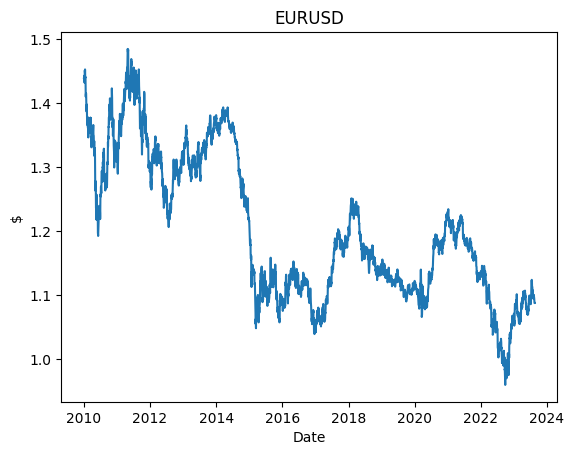

In [16]:

# Plot the GDP series
plt.plot(fx['Date'], fx['EURUSD'])

# Set the x-axis label
plt.xlabel('Date')

# Set the y-axis label
plt.ylabel('$')

# Set the title of the plot
plt.title('EURUSD')

# Display the plot
plt.show()


In [17]:
# Convert 'Date' column to datetime type
fx.loc[:, 'Date'] = pd.to_datetime(fx['Date'])

# Set 'Date' column as the DataFrame index
fx.set_index('Date', inplace=True)

# Resample the DataFrame to a daily interval and forward-fill missing values
fx_d = fx.resample('D').last().ffill()

# Resample the DataFrame to a weekly interval and forward-fill missing values
fx_weekly = fx.resample('W').last().ffill()

# Resample the DataFrame to a Monthly interval and forward-fill missing values
fx_m = fx.resample('M').last().ffill()

# Resample the DataFrame to a Yearly interval and forward-fill missing values
fx_y = fx.resample('Y').last().ffill()


<ipython-input-17-ef815efb632b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx.loc[:, 'Date'] = pd.to_datetime(fx['Date'])
<ipython-input-17-ef815efb632b>:2: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  fx.loc[:, 'Date'] = pd.to_datetime(fx['Date'])


###Yearly Resample Animated Chart


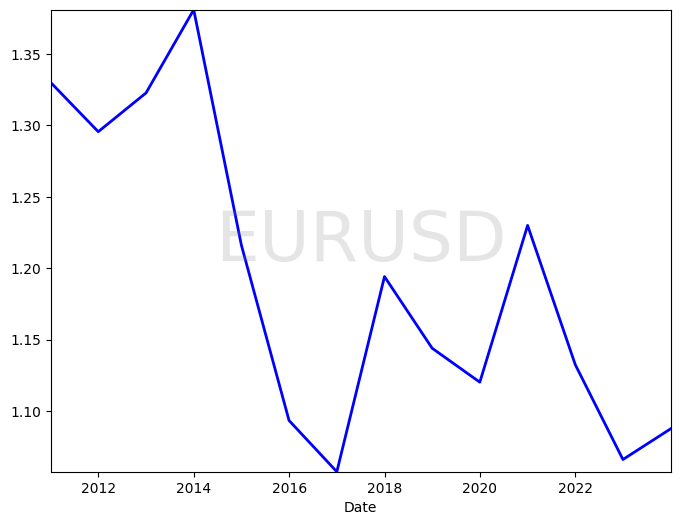

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Assuming you already have the 'fx_y' DataFrame after resampling

# Reset the index of the resampled DataFrame
fx_y = fx_y.reset_index()

# Set up the figure and axes
fig, ax = plt.subplots(figsize=(8, 6))

# Initialize an empty line plot
line, = ax.plot([], [], lw=2, color='blue')  # Use a white color for the series line

# Set the x and y limits for the plot
ax.set_xlim(fx_y['Date'].min(), fx_y['Date'].max())
ax.set_ylim(fx_y['EURUSD'].min(), fx_y['EURUSD'].max())

# Set the x-axis label
ax.set_xlabel('Date')

# Set the background color and opacity for the title watermark
ax.text(0.5, 0.5, 'EURUSD', color='gray', fontsize=50, alpha=0.2,
        ha='center', va='center', transform=ax.transAxes)

# Define the update function for the animation
def update(frame):
    # Get the data up to the current frame
    data = fx_y.iloc[:frame + 1]

    # Update the line plot with the new data
    line.set_data(data['Date'], data['EURUSD'])

    return line,

# Create the animation
ani = animation.FuncAnimation(fig, update, frames=len(fx_y) * 2, interval=500, blit=True)

# Convert the animation to HTML
html_ani = ani.to_jshtml()

# Display the animated chart
HTML(html_ani)


### Monthly resample animated Chart

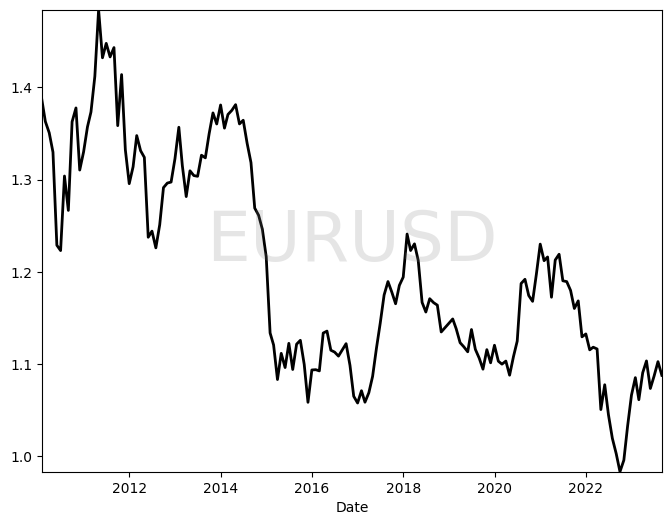

In [19]:
# Reset the index of the resampled DataFrame
fx_m = fx_m.reset_index()

# Set up the figure and axes
fig, ax = plt.subplots(figsize=(8, 6))

# Initialize an empty line plot
line, = ax.plot([], [], lw=2, color='black')  # Use a white color for the series line

# Set the x and y limits for the plot
ax.set_xlim(fx_m['Date'].min(), fx_m['Date'].max())
ax.set_ylim(fx_m['EURUSD'].min(), fx_m['EURUSD'].max())

# Set the x-axis label
ax.set_xlabel('Date')

# Set the background color and opacity for the title watermark
ax.text(0.5, 0.5, 'EURUSD', color='gray', fontsize=50, alpha=0.2,
        ha='center', va='center', transform=ax.transAxes)

# Define the update function for the animation
def update(frame):
    # Get the data up to the current frame
    data = fx_m.iloc[:frame + 1]

    # Update the line plot with the new data
    line.set_data(data['Date'], data['EURUSD'])

    return line,

# Create the animation
ani = animation.FuncAnimation(fig, update, frames=len(fx_m) * 2, interval=100, blit=True)

# Convert the animation to HTML
html_ani = ani.to_jshtml()

# Display the animated chart
HTML(html_ani)